# NYC Citi Bike Trip Analysis with Hadoop, SparkSQL and GeoPandas
---

### Project Overview
This notebook performs a detailed analysis of New York City's Citi Bike data using **Hadoop HDFS** for storage and **SparkSQL** for data processing. Through SQL queries, data exploration, and spatial visualizations, we uncover trends in bike usage patterns and high-demand zones across the city.

- **Dataset**: Over 400,000 Citi Bike trip records from 2023
- **Tools**: Hadoop, SparkSQL, Pandas, GeoPandas, Folium, Matplotlib, and Seaborn
- **Objectives**: Identify usage patterns, peak hours, popular routes, and visualize spatial demand hotspots

---

## Table of Contents
1. [Data Loading and Storage with Hadoop HDFS](#data-loading)
2. [Data Exploration and Integrity Checks](#data-exploration)
3. [SQL-Based Data Analysis](#sql-analysis)
4. [Data Visualization](#visualization)
5. [Geospatial Analysis and Visualization](#geospatial-analysis)


## 1. Data Loading and Storage with Hadoop HDFS <a class="anchor" id="data-loading"></a>
---

### Overview
In this section, we load the Citi Bike dataset into Hadoop’s HDFS, enabling distributed storage. Storing the dataset in HDFS allows us to efficiently handle large-scale data and leverage SparkSQL for processing.

> **Note**: Ensure Hadoop and Spark are properly configured on your system to proceed with loading and processing data.

---


In [1]:
from pyspark.sql import SparkSession

# Initialize the Spark session
spark = SparkSession.builder \
    .appName("CitiBike Analysis") \
    .config("spark.hadoop.fs.defaultFS", "hdfs://localhost:9000") \
    .getOrCreate()


24/11/04 12:41:46 WARN Utils: Your hostname, Ajits-MacBook-Pro.local resolves to a loopback address: 127.0.0.1; using 172.16.6.50 instead (on interface en0)
24/11/04 12:41:46 WARN Utils: Set SPARK_LOCAL_IP if you need to bind to another address
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
24/11/04 12:41:46 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from pyspark.sql.functions import col, when, count
import geopandas as gpd
import folium
import pandas as pd
from folium.plugins import HeatMap


In [3]:
#List files in the HDFS directory
!hdfs dfs -ls /user/ajitsingh/citibike

2024-11-04 12:41:48,247 WARN util.NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
Found 2 items
-rw-r--r--   1 ajitsingh supergroup   89071914 2024-11-03 17:33 /user/ajitsingh/citibike/citibike_2023.csv
drwxr-xr-x   - ajitsingh supergroup          0 2024-11-04 11:47 /user/ajitsingh/citibike/total_trips


## 2. Data Exploration and Integrity Checks <a class="anchor" id="data-exploration"></a>
---

### Objective
Before diving into analysis, it is essential to check the data’s quality and structure. We’ll explore the dataset by:
- Examining column data types and sample records
- Checking for **null values** and **data integrity** to identify and handle missing or inconsistent values.

> **Important**: Data integrity checks ensure our results are reliable and accurate.

---


In [4]:
#Load the CSV data from HDFS
df = spark.read.csv("hdfs:///user/ajitsingh/citibike/citibike_2023.csv", header=True, inferSchema=True)

# Show the first few rows to confirm the data is loaded correctly
df.show(5)


+----------------+-------------+--------------------+--------------------+--------------------+----------------+--------------------+--------------+-----------+------------+-----------------+------------------+-------------+
|         ride_id|rideable_type|          started_at|            ended_at|  start_station_name|start_station_id|    end_station_name|end_station_id|  start_lat|   start_lng|          end_lat|           end_lng|member_casual|
+----------------+-------------+--------------------+--------------------+--------------------+----------------+--------------------+--------------+-----------+------------+-----------------+------------------+-------------+
|19945455B3F6B9D5| classic_bike|2023-05-25 20:04:...|2023-05-25 20:19:...|     1 Ave & E 39 St|         6303.01|     W 54 St & 9 Ave|       6920.03|   40.74714|   -73.97113|      40.76584941|      -73.98690506|       member|
|4A506EDE4D3654A6| classic_bike|2023-05-22 10:32:...|2023-05-22 10:38:...|    E 142 St & 3 Ave|     

In [5]:
df.printSchema()

root
 |-- ride_id: string (nullable = true)
 |-- rideable_type: string (nullable = true)
 |-- started_at: timestamp (nullable = true)
 |-- ended_at: timestamp (nullable = true)
 |-- start_station_name: string (nullable = true)
 |-- start_station_id: double (nullable = true)
 |-- end_station_name: string (nullable = true)
 |-- end_station_id: string (nullable = true)
 |-- start_lat: double (nullable = true)
 |-- start_lng: double (nullable = true)
 |-- end_lat: double (nullable = true)
 |-- end_lng: double (nullable = true)
 |-- member_casual: string (nullable = true)



In [6]:
df.describe(["start_lat", "start_lng", "end_lat", "end_lng"]).show()


24/11/04 12:41:52 WARN SparkStringUtils: Truncated the string representation of a plan since it was too large. This behavior can be adjusted by setting 'spark.sql.debug.maxToStringFields'.


+-------+-------------------+-------------------+-------------------+--------------------+
|summary|          start_lat|          start_lng|            end_lat|             end_lng|
+-------+-------------------+-------------------+-------------------+--------------------+
|  count|             453152|             453152|             453152|              453152|
|   mean|  40.74077354698197| -73.97422077755812|  40.74115725219963|   -73.9746330830265|
| stddev|0.04057490514393339|0.02802252087190215|0.03975739113414088|0.028232893168562957|
|    min|       40.633371353|         -74.026823|          40.633385|          -74.066921|
|    max|       40.882351398|       -73.87307632|           40.88226|      -73.8833650931|
+-------+-------------------+-------------------+-------------------+--------------------+



In [7]:
# Count null values in each column
null_counts = df.select([count(when(col(c).isNull(), c)).alias(c) for c in df.columns])
null_counts.show()


+-------+-------------+----------+--------+------------------+----------------+----------------+--------------+---------+---------+-------+-------+-------------+
|ride_id|rideable_type|started_at|ended_at|start_station_name|start_station_id|end_station_name|end_station_id|start_lat|start_lng|end_lat|end_lng|member_casual|
+-------+-------------+----------+--------+------------------+----------------+----------------+--------------+---------+---------+-------+-------+-------------+
|      0|            0|         0|       0|                 0|               0|               0|             0|        0|        0|      0|      0|            0|
+-------+-------------+----------+--------+------------------+----------------+----------------+--------------+---------+---------+-------+-------+-------------+



In [8]:
df.select("rideable_type").distinct().show()
df.select("member_casual").distinct().show()


+-------------+
|rideable_type|
+-------------+
|electric_bike|
| classic_bike|
+-------------+

+-------------+
|member_casual|
+-------------+
|       casual|
|       member|
+-------------+



## 3. SQL-Based Data Analysis <a class="anchor" id="sql-analysis"></a>
---

### Analysis Objectives
This section utilizes **SparkSQL** to perform a series of SQL queries on our Citi Bike dataset. Through both basic and advanced queries, we’ll uncover insights into usage trends and user behavior.

### Key Queries
1. **Total Trips**: Count the total number of bike trips to understand the dataset’s scope.
2. **Trips by Day and User Type**: Analyze usage patterns across different user types (members vs. casual) and days of the week.
3. **Top Routes**: Identify the top 5 most frequently traveled routes based on start and end stations.
4. **Average Trip Duration**: Examine trip durations by bike type, time of day, and day of the week.


---


In [9]:
# Create a temporary view for SQL queries
df.createOrReplaceTempView("citibike_data")


In [10]:
#Total Trips

total_trips = spark.sql("SELECT COUNT(*) AS total_trips FROM citibike_data")
total_trips.show()


+-----------+
|total_trips|
+-----------+
|     453152|
+-----------+



In [11]:
#Bike Type

bike_type_counts = spark.sql("""
    SELECT rideable_type, COUNT(*) AS trip_count
    FROM citibike_data
    GROUP BY rideable_type
    ORDER BY trip_count DESC
""")
bike_type_counts.show()


+-------------+----------+
|rideable_type|trip_count|
+-------------+----------+
| classic_bike|    274141|
|electric_bike|    179011|
+-------------+----------+



In [12]:
#average trip duration by member type

avg_trip_duration = spark.sql("""
    SELECT member_casual AS user_type, AVG(unix_timestamp(ended_at) - unix_timestamp(started_at)) / 60 AS avg_trip_duration_min
    FROM citibike_data
    GROUP BY member_casual
""")
avg_trip_duration.show()


+---------+---------------------+
|user_type|avg_trip_duration_min|
+---------+---------------------+
|   casual|    23.09511159139688|
|   member|    12.70469272097117|
+---------+---------------------+



In [13]:
#Popular stations

popular_stations = spark.sql("""
    SELECT start_station_name, COUNT(*) AS start_count
    FROM citibike_data
    GROUP BY start_station_name
    ORDER BY start_count DESC
    LIMIT 10
""")
popular_stations.show()


+--------------------+-----------+
|  start_station_name|start_count|
+--------------------+-----------+
|     W 31 St & 7 Ave|       4853|
|Christopher St & ...|       3443|
|     W 41 St & 8 Ave|       3257|
|Lafayette St & E ...|       3172|
|     6 Ave & W 45 St|       2970|
|    12 Ave & W 40 St|       2768|
|Cleveland Pl & Sp...|       2636|
|     E 77 St & 1 Ave|       2622|
|North Moore St & ...|       2580|
|      1 Ave & E 6 St|       2554|
+--------------------+-----------+



In [14]:
# Top 5 most frequent routes by hour and user type
top_routes_by_hour = spark.sql("""
    SELECT 
        start_station_name, 
        end_station_name, 
        member_casual,
        HOUR(started_at) AS trip_hour,
        COUNT(*) AS trip_count
    FROM 
        citibike_data
    WHERE 
        start_station_name IS NOT NULL 
        AND end_station_name IS NOT NULL
    GROUP BY 
        start_station_name, 
        end_station_name, 
        member_casual, 
        HOUR(started_at)
    ORDER BY 
        trip_count DESC
    LIMIT 5
""")

# Display the results
top_routes_by_hour.show()



+--------------------+--------------------+-------------+---------+----------+
|  start_station_name|    end_station_name|member_casual|trip_hour|trip_count|
+--------------------+--------------------+-------------+---------+----------+
|North Moore St & ...|Vesey St & Church St|       member|       17|       151|
|     E 77 St & 1 Ave|     E 77 St & 3 Ave|       member|        7|        97|
|North Moore St & ...|Vesey Pl & River ...|       member|       17|        91|
|       46 Ave & 5 St|      45 Ave & 21 St|       member|        8|        70|
|     E 77 St & 1 Ave|     E 77 St & 3 Ave|       member|        8|        61|
+--------------------+--------------------+-------------+---------+----------+



In [15]:
# Average trip duration by bike type, hour, and day of the week

avg_trip_duration = spark.sql("""
    SELECT 
        rideable_type,
        DAYOFWEEK(started_at) AS day_of_week,
        HOUR(started_at) AS trip_hour,
        AVG(TIMESTAMPDIFF(MINUTE, started_at, ended_at)) AS avg_trip_duration
    FROM 
        citibike_data
    WHERE 
        started_at IS NOT NULL 
        AND ended_at IS NOT NULL
        AND TIMESTAMPDIFF(MINUTE, started_at, ended_at) > 0  -- Exclude trips with non-positive duration
    GROUP BY 
        rideable_type,
        DAYOFWEEK(started_at),
        HOUR(started_at)
    ORDER BY 
        avg_trip_duration DESC
    LIMIT 10
""")

# Display the results
avg_trip_duration.show()


+-------------+-----------+---------+------------------+
|rideable_type|day_of_week|trip_hour| avg_trip_duration|
+-------------+-----------+---------+------------------+
| classic_bike|          3|        2| 26.46031746031746|
| classic_bike|          1|        3|24.294117647058822|
| classic_bike|          2|        2|23.831683168316832|
| classic_bike|          2|        1|22.287128712871286|
|electric_bike|          7|       15|21.193181818181817|
|electric_bike|          1|       15|20.572345390898484|
|electric_bike|          1|       13| 19.91286307053942|
| classic_bike|          7|       14|19.796523113393917|
|electric_bike|          1|       16|19.654806491885143|
| classic_bike|          7|       20| 19.61533052039381|
+-------------+-----------+---------+------------------+



## 4.SQL-based Data Visualization <a class="anchor" id="visualization"></a>
---

### Visualization Objectives
Data visualization provides a graphical representation of the trends discovered through SQL analysis, making patterns and insights easier to interpret.

### Key Plots
1. **Total Trips by Bike Type Bar Plot**: A simple bar plot showing the total number of trips by bike type, setting the stage for deeper analysis.
   
2. **Popular Stations Column Plot**: Displays the most frequently used start and end stations, highlighting high-demand areas.

3. **Usage by Hour of Day Line Plot**: Shows the distribution of trips across hours, identifying peak usage times.

4. **Bike Type Usage by Day of the Week**: Visualizes the popularity of different bike types (classic, electric) across the days of the week.
5. **User Type by Day of the Week**: Compares usage patterns of members and casual users across the week.

> **Insight**: These visualizations make data-driven insights more accessible and actionable, enhancing the impact of our SQL analysis.

---


/var/folders/tq/11x_4qtd021fc63b_j873k5r0000gn/T/ipykernel_10110/4064707054.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=bike_type_df, x='rideable_type', y='trip_count', palette='viridis')


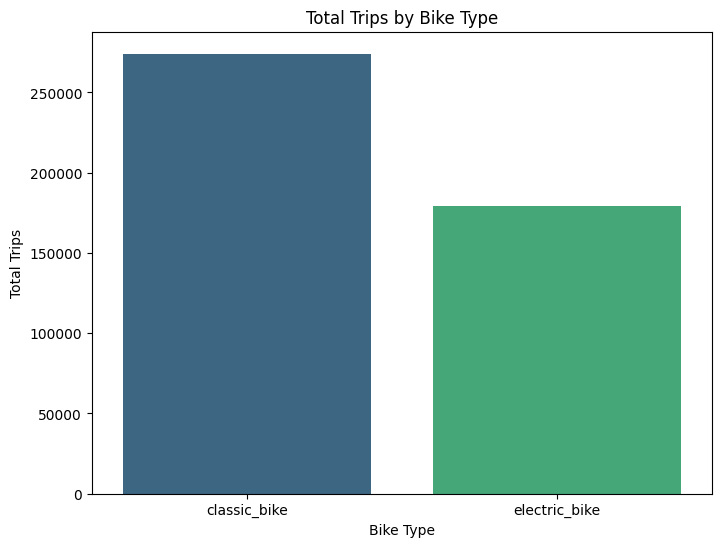

In [16]:
bike_type_counts = spark.sql("""
    SELECT rideable_type, COUNT(*) AS trip_count
    FROM citibike_data
    GROUP BY rideable_type
    ORDER BY trip_count DESC
""")
bike_type_df = bike_type_counts.toPandas()


plt.figure(figsize=(8, 6))
sns.barplot(data=bike_type_df, x='rideable_type', y='trip_count', palette='viridis')
plt.title("Total Trips by Bike Type")
plt.xlabel("Bike Type")
plt.ylabel("Total Trips")
plt.show()


/var/folders/tq/11x_4qtd021fc63b_j873k5r0000gn/T/ipykernel_10110/2634468242.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=popular_stations_df, y='start_station_name', x='start_count', palette='coolwarm')


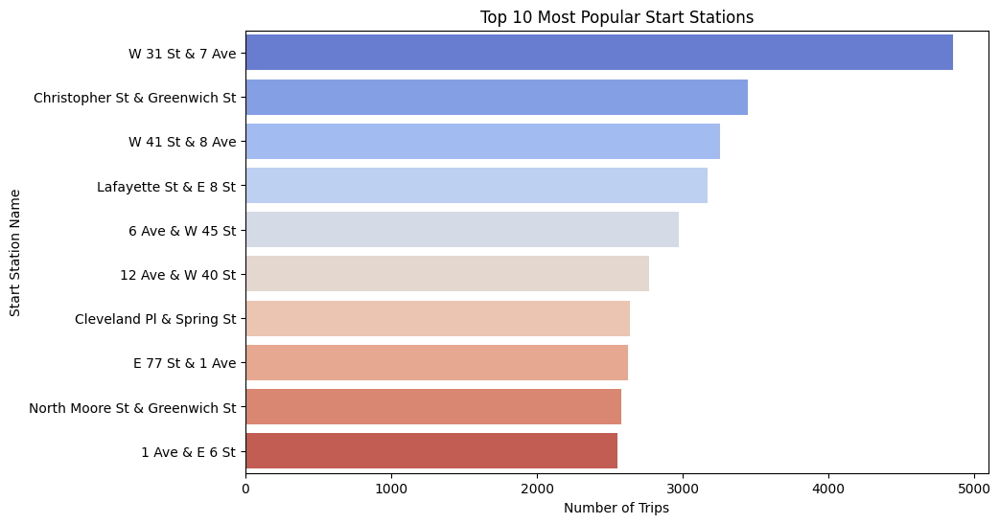

In [17]:
popular_stations = spark.sql("""
    SELECT start_station_name, COUNT(*) AS start_count
    FROM citibike_data
    GROUP BY start_station_name
    ORDER BY start_count DESC
    LIMIT 10
""")
popular_stations_df = popular_stations.toPandas()

plt.figure(figsize=(10, 6))
sns.barplot(data=popular_stations_df, y='start_station_name', x='start_count', palette='coolwarm')
plt.title("Top 10 Most Popular Start Stations")
plt.xlabel("Number of Trips")
plt.ylabel("Start Station Name")
plt.show()


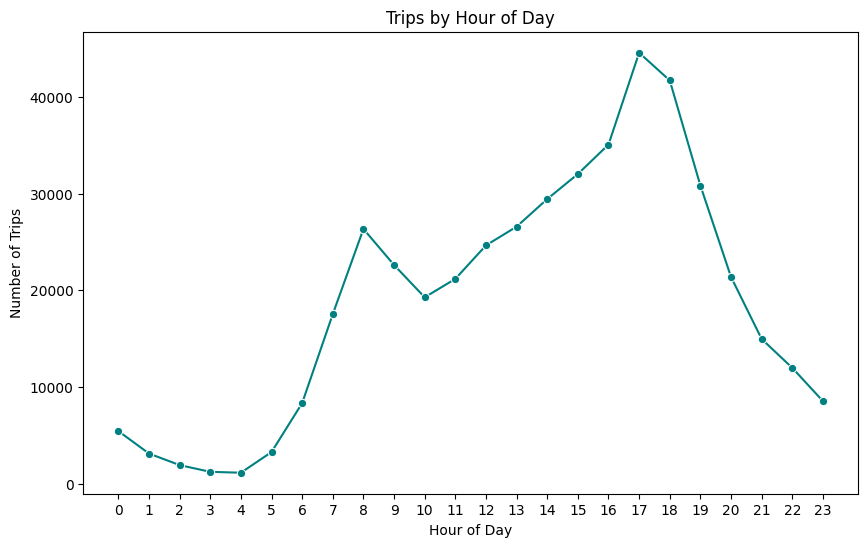

In [18]:
peak_hours = spark.sql("""
    SELECT HOUR(started_at) AS start_hour, COUNT(*) AS trip_count
    FROM citibike_data
    GROUP BY HOUR(started_at)
    ORDER BY start_hour
""")
peak_hours_df = peak_hours.toPandas()


plt.figure(figsize=(10, 6))
sns.lineplot(data=peak_hours_df, x='start_hour', y='trip_count', marker='o', color='teal')
plt.title("Trips by Hour of Day")
plt.xlabel("Hour of Day")
plt.ylabel("Number of Trips")
plt.xticks(range(0, 24))  # Show each hour on the x-axis
plt.show()


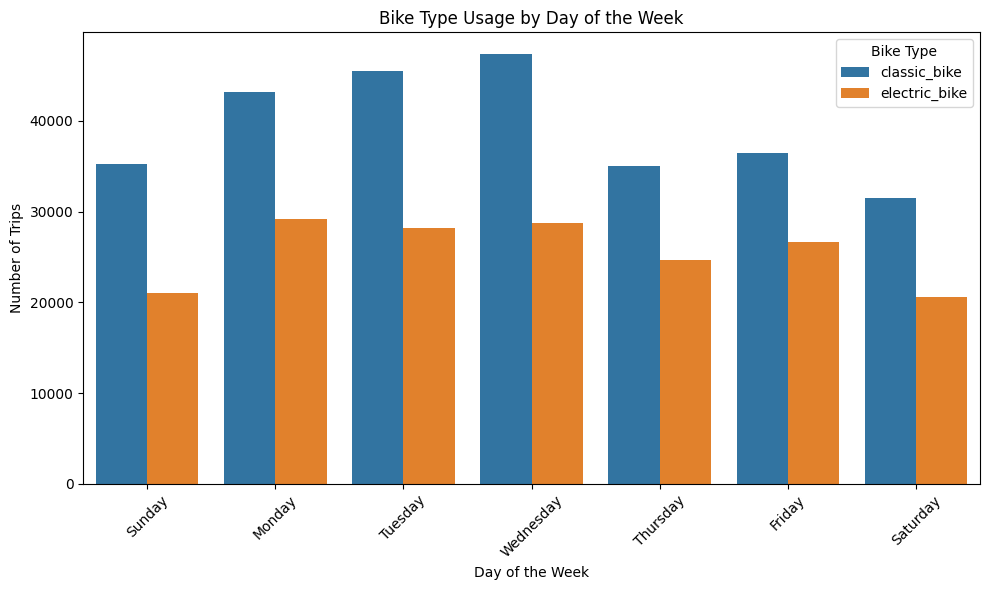

In [19]:
# Query to get bike usage by day of the week
bike_usage_by_day = spark.sql("""
    SELECT 
        rideable_type,
        DAYOFWEEK(started_at) AS day_of_week,
        COUNT(*) AS trip_count
    FROM 
        citibike_data
    WHERE 
        rideable_type IS NOT NULL 
        AND started_at IS NOT NULL
    GROUP BY 
        rideable_type, DAYOFWEEK(started_at)
    ORDER BY 
        day_of_week, rideable_type
""").toPandas()


# Rename day_of_week to represent days for better readability
day_labels = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"]
bike_usage_by_day['day_of_week'] = bike_usage_by_day['day_of_week'].apply(lambda x: day_labels[x - 1])

# Plot bike usage by day of the week
plt.figure(figsize=(10, 6))
sns.barplot(data=bike_usage_by_day, x='day_of_week', y='trip_count', hue='rideable_type')
plt.title("Bike Type Usage by Day of the Week")
plt.xlabel("Day of the Week")
plt.ylabel("Number of Trips")
plt.legend(title="Bike Type")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


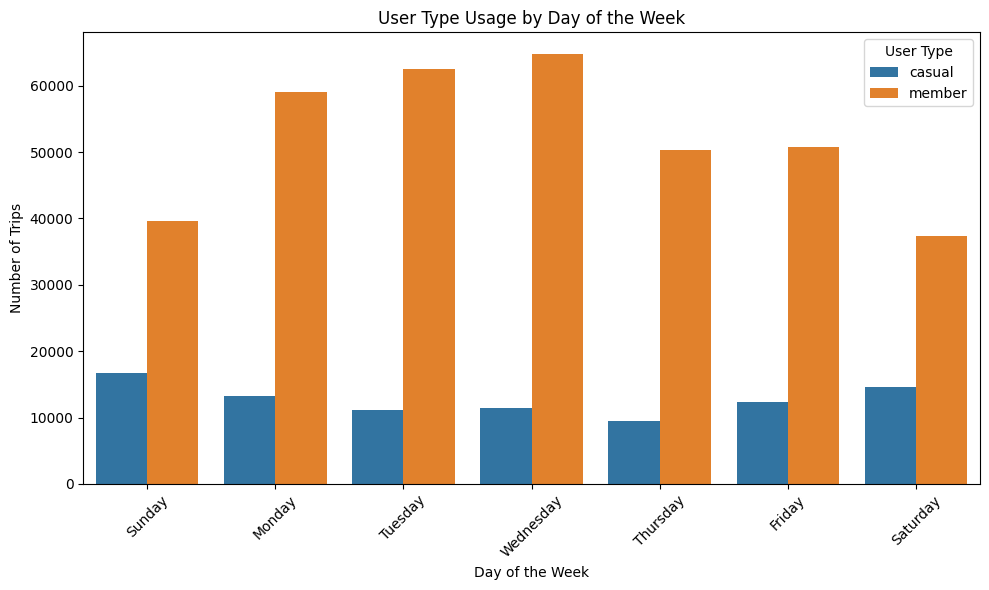

In [20]:
# Query to get user type usage by day of the week
user_type_by_day = spark.sql("""
    SELECT 
        member_casual,
        DAYOFWEEK(started_at) AS day_of_week,
        COUNT(*) AS trip_count
    FROM 
        citibike_data
    WHERE 
        member_casual IS NOT NULL 
        AND started_at IS NOT NULL
    GROUP BY 
        member_casual, DAYOFWEEK(started_at)
    ORDER BY 
        day_of_week, member_casual
""").toPandas()

# Rename day_of_week for readability
user_type_by_day['day_of_week'] = user_type_by_day['day_of_week'].apply(lambda x: day_labels[x - 1])

# Plot user type usage by day of the week
plt.figure(figsize=(10, 6))
sns.barplot(data=user_type_by_day, x='day_of_week', y='trip_count', hue='member_casual')
plt.title("User Type Usage by Day of the Week")
plt.xlabel("Day of the Week")
plt.ylabel("Number of Trips")
plt.legend(title="User Type")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


## 6. Geospatial Analysis and Visualization <a class="anchor" id="geospatial-analysis"></a>
---

### Geospatial Analysis Overview
This section delves into the geographic aspects of the Citi Bike data, using **GeoPandas** and **Folium** to analyze and visualize spatial patterns. These visualizations provide insight into high-demand stations, popular routes, and geographic clusters in NYC’s bike-sharing network.

### Key Steps
1. **Data Conversion**: Convert the Spark DataFrame to a Pandas DataFrame for compatibility with geospatial libraries.
2. **Geopy Distance Calculations**: Calculate the geodesic distance between start and end stations for each trip, enabling distance-based route analysis.
3. **Convex Hulls for High-Demand Zones**: Create convex hulls around the top 5 most frequent start and end stations to highlight high-demand areas.

### Map Visualizations
1. **Top 5 Start and End Stations**:
   - Displays the five most frequently used start and end stations as markers on a map, providing a visual overview of high-demand locations.

2. **Top 5 Longest Distance Station Pairs**:
   - Shows the top 5 station pairs with the longest trip distances (in kilometers). These trips provide insight into the most extensive routes taken by Citi Bike users.

3. **Top 5 Busiest Start-End Pairs**:
   - Visualizes the top 5 most frequently traveled routes, with unique colors assigned to each start-end station pair. This map highlights the most popular routes used by riders.

4. **Convex Hull Boundaries for High-Demand Stations**:
   - Draws convex hull boundaries around the top 5 start stations (in green) and top 5 end stations (in red), identifying the zones with the highest trip starts and ends.

5. **Heat Map of Trip Density**:
   - Displays a heat map of trip density across NYC, with brighter colors representing areas with higher trip volumes. This visualization provides a clear picture of spatial demand distribution.

> **Insight**: These visualizations highlight key spatial insights, such as high-demand zones, popular routes, and geographic trip density, all of which can inform resource planning and operational improvements in NYC’s bike-sharing network.

---


In [21]:
# Convert Spark Data Frame to pandas

start_end_df = df.select("start_station_name", "start_lat", "start_lng", "end_station_name", "end_lat", "end_lng").toPandas()


In [22]:
#creating geopandas dataframe for start and end stations

import geopandas as gpd
from shapely.geometry import Point

# GeoDataFrame for Start Stations
start_gdf = gpd.GeoDataFrame(
    start_end_df,
    geometry=gpd.points_from_xy(start_end_df.start_lng, start_end_df.start_lat),
    crs="EPSG:4326"
)

# GeoDataFrame for End Stations
end_gdf = gpd.GeoDataFrame(
    start_end_df,
    geometry=gpd.points_from_xy(start_end_df.end_lng, start_end_df.end_lat),
    crs="EPSG:4326"
)


In [23]:
# Top 5 Start Stations
top_start_stations = spark.sql("""
    SELECT start_station_name, start_lat, start_lng, COUNT(*) AS start_count
    FROM citibike_data
    GROUP BY start_station_name, start_lat, start_lng
    ORDER BY start_count DESC
    LIMIT 5
""")
top_start_stations_df = top_start_stations.toPandas()

# Top 5 End Stations
top_end_stations = spark.sql("""
    SELECT end_station_name, end_lat, end_lng, COUNT(*) AS end_count
    FROM citibike_data
    GROUP BY end_station_name, end_lat, end_lng
    ORDER BY end_count DESC
    LIMIT 5
""")
top_end_stations_df = top_end_stations.toPandas()


In [24]:
import folium

# Initialize the map centered around NYC
m = folium.Map(location=[40.7128, -74.0060], zoom_start=12)

# Add start station markers
for _, row in top_start_stations_df.iterrows():
    folium.CircleMarker(
        location=[row['start_lat'], row['start_lng']],
        radius=8,
        color='blue',
        fill=True,
        fill_opacity=0.6,
        popup=f"Start Station: {row['start_station_name']} ({row['start_count']} trips)"
    ).add_to(m)

# Add end station markers
for _, row in top_end_stations_df.iterrows():
    folium.CircleMarker(
        location=[row['end_lat'], row['end_lng']],
        radius=8,
        color='red',
        fill=True,
        fill_opacity=0.6,
        popup=f"End Station: {row['end_station_name']} ({row['end_count']} trips)"
    ).add_to(m)

# Display map
m


In [25]:
# Check the columns in the DataFrame
print(top_start_stations_df.columns)
print(top_start_stations_df.head())


Index(['start_station_name', 'start_lat', 'start_lng', 'start_count'], dtype='object')
              start_station_name  start_lat  start_lng  start_count
0                W 31 St & 7 Ave  40.749156 -73.991600         3683
1  Christopher St & Greenwich St  40.732916 -74.007114         2798
2          Lafayette St & E 8 St  40.730207 -73.991026         2595
3                W 41 St & 8 Ave  40.756405 -73.990026         2456
4               12 Ave & W 40 St  40.760875 -74.002777         2291


In [26]:
from geopy.distance import geodesic

# Retrieve unique start-end pairs with coordinates
routes_df = spark.sql("""
    SELECT DISTINCT start_station_name, end_station_name, start_lat, start_lng, end_lat, end_lng
    FROM citibike_data
    WHERE start_lat IS NOT NULL AND start_lng IS NOT NULL
          AND end_lat IS NOT NULL AND end_lng IS NOT NULL
""").toPandas()

# Calculate the distance for each route
routes_df['distance_km'] = routes_df.apply(
    lambda row: geodesic((row['start_lat'], row['start_lng']), (row['end_lat'], row['end_lng'])).kilometers,
    axis=1
)

# Sort by distance and select the top 5 longest routes
top_routes_by_distance_df = routes_df.sort_values(by='distance_km', ascending=False).head(5)

top_routes_by_distance_df


,start_station_name,end_station_name,start_lat,start_lng,end_lat,end_lng,distance_km
115524,Caton Ave & E 10 St,E 188 St & Creston Ave,40.648687,-73.970302,40.861669,-73.898589,24.414474
110959,Broadway & W 155 St,Broadway & W 155 St,40.647254,-74.001140,40.832990,-73.945920,21.146574
51373,5 Av & W 139 St,E 161 St & Park Ave,40.649217,-74.012370,40.824811,-73.916407,21.117194
13484,Broadway & W 220 St,Bus Slip & State St,40.872412,-73.912807,40.701907,-74.013942,20.769826
109710,W 190 St & Broadway,Eastern Pkwy & Franklin Ave,40.856481,-73.932979,40.670777,-73.957680,20.727534


In [27]:
import folium
from itertools import cycle

# Initialize the map centered around NYC
m = folium.Map(location=[40.7128, -74.0060])

# Define a list of colors for each pair
pair_colors = ['red', 'blue', 'green', 'purple', 'orange']
color_cycle = cycle(pair_colors)  # Cycle through colors if more than 5 pairs

# Offset amount to visually separate markers if needed
offset = 0.0001

# Track used start and end locations to avoid reusing the same color
assigned_colors = {}

# Loop through each pair and add markers for start and end stations with unique colors
for idx, row in top_routes_by_distance_df.iterrows():
    # Create a unique identifier for the pair to avoid color overlap
    start_end_pair = (row['start_station_name'], row['end_station_name'])
    
    # Assign a color from the cycle if not previously assigned
    if start_end_pair not in assigned_colors:
        assigned_colors[start_end_pair] = next(color_cycle)
    
    color = assigned_colors[start_end_pair]
    
    # Add a marker for the start station
    folium.CircleMarker(
        location=[row['start_lat'] + offset, row['start_lng'] + offset],  # Offset to avoid overlap
        radius=8,
        color=color,
        fill=True,
        fill_opacity=0.6,
        popup=f"Start Station: {row['start_station_name']} (Distance: {row['distance_km']:.2f} km)"
    ).add_to(m)

    # Add a marker for the end station
    folium.CircleMarker(
        location=[row['end_lat'] - offset, row['end_lng'] - offset],  # Offset to avoid overlap
        radius=8,
        color=color,
        fill=True,
        fill_opacity=0.6,
        popup=f"End Station: {row['end_station_name']} (Distance: {row['distance_km']:.2f} km)"
    ).add_to(m)

# Display the map
m


In [28]:
# SQL query to find the top 5 most frequently traveled start-end station pairs
top_pairs = spark.sql("""
    SELECT start_station_name, end_station_name, start_lat, start_lng, end_lat, end_lng, COUNT(*) AS trip_count
    FROM citibike_data
    GROUP BY start_station_name, end_station_name, start_lat, start_lng, end_lat, end_lng
    ORDER BY trip_count DESC
    LIMIT 5
""")
top_pairs_df = top_pairs.toPandas()

# Print the top 5 pairs for verification
print("Top 5 Start-End Station Pairs by Trip Count:")
print(top_pairs_df[['start_station_name', 'end_station_name', 'trip_count']])


Top 5 Start-End Station Pairs by Trip Count:
      start_station_name  end_station_name  trip_count
0        1 Ave & E 62 St   1 Ave & E 68 St         441
1  West St & Chambers St  10 Ave & W 14 St         438
2       12 Ave & W 40 St  10 Ave & W 14 St         430
3        E 77 St & 1 Ave   E 77 St & 3 Ave         390
4       10 Ave & W 14 St  10 Ave & W 14 St         325


In [29]:
import folium

# Initialize the map centered around NYC
m = folium.Map(location=[40.7128, -74.0060], zoom_start=12)

# Define a list of colors for each pair
pair_colors = ['red', 'blue', 'green', 'purple', 'orange']

# Offset amount to visually separate markers if needed
offset = 0.0001

# Loop through each pair and add markers for start and end stations with unique colors
for idx, row in top_pairs_df.iterrows():
    color = pair_colors[idx % len(pair_colors)]  # Assign a unique color to each pair
    
    # Add a marker for the start station
    folium.CircleMarker(
        location=[row['start_lat'] + offset, row['start_lng'] + offset],  # Offset to avoid overlap
        radius=8,
        color=color,
        fill=True,
        fill_opacity=0.6,
        popup=f"Start Station: {row['start_station_name']} (Trips: {row['trip_count']})"
    ).add_to(m)

    # Add a marker for the end station
    folium.CircleMarker(
        location=[row['end_lat'] - offset, row['end_lng'] - offset],  # Offset to avoid overlap
        radius=8,
        color=color,
        fill=True,
        fill_opacity=0.6,
        popup=f"End Station: {row['end_station_name']} (Trips: {row['trip_count']})"
    ).add_to(m)

# Display the map
m


In [30]:
# Retrieve top 5 start stations
top_start_stations = spark.sql("""
    SELECT start_station_name, start_lat, start_lng, COUNT(*) AS trip_count
    FROM citibike_data
    GROUP BY start_station_name, start_lat, start_lng
    ORDER BY trip_count DESC
    LIMIT 5
""").toPandas()

# Retrieve top 5 end stations
top_end_stations = spark.sql("""
    SELECT end_station_name, end_lat, end_lng, COUNT(*) AS trip_count
    FROM citibike_data
    GROUP BY end_station_name, end_lat, end_lng
    ORDER BY trip_count DESC
    LIMIT 5
""").toPandas()


In [31]:
import geopandas as gpd
from shapely.geometry import Point
import folium

# Convert top start stations to GeoDataFrame
start_gdf = gpd.GeoDataFrame(
    top_start_stations,
    geometry=gpd.points_from_xy(top_start_stations.start_lng, top_start_stations.start_lat),
    crs="EPSG:4326"
)

# Convert top end stations to GeoDataFrame
end_gdf = gpd.GeoDataFrame(
    top_end_stations,
    geometry=gpd.points_from_xy(top_end_stations.end_lng, top_end_stations.end_lat),
    crs="EPSG:4326"
)

# Calculate convex hulls using the updated `union_all()` method
start_hull = start_gdf.geometry.union_all().convex_hull
end_hull = end_gdf.geometry.union_all().convex_hull

# Initialize the map centered around NYC
m = folium.Map(location=[40.7128, -74.0060], zoom_start=12)

# Add light green polygon for the start station boundary
folium.GeoJson(
    data=gpd.GeoSeries([start_hull]).__geo_interface__,
    style_function=lambda x: {
        'fillColor': 'lightgreen',
        'color': 'green',
        'fillOpacity': 0.3,
        'weight': 2
    },
    tooltip="Top 5 Start Stations Boundary"
).add_to(m)

# Add light red polygon for the end station boundary
folium.GeoJson(
    data=gpd.GeoSeries([end_hull]).__geo_interface__,
    style_function=lambda x: {
        'fillColor': 'lightcoral',
        'color': 'red',
        'fillOpacity': 0.3,
        'weight': 2
    },
    tooltip="Top 5 End Stations Boundary"
).add_to(m)

# Add markers for each start and end station
for _, row in start_gdf.iterrows():
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=5,
        color='green',
        fill=True,
        fill_opacity=1,
        popup=f"Start Station: {row['start_station_name']} (Trips: {row['trip_count']})"
    ).add_to(m)

for _, row in end_gdf.iterrows():
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=5,
        color='red',
        fill=True,
        fill_opacity=1,
        popup=f"End Station: {row['end_station_name']} (Trips: {row['trip_count']})"
    ).add_to(m)

# Display the map
m


In [32]:
# Retrieve start locations data
start_locations = spark.sql("""
    SELECT start_lat, start_lng
    FROM citibike_data
    WHERE start_lat IS NOT NULL AND start_lng IS NOT NULL
""").toPandas()

# Prepare data for the heatmap: list of [lat, lng] pairs
start_location_data = start_locations[['start_lat', 'start_lng']].values.tolist()


In [33]:
import folium
from folium.plugins import HeatMap

# Initialize a map centered around NYC
m = folium.Map(location=[40.7128, -74.0060], zoom_start=12)

# Add heatmap layer
HeatMap(start_location_data, radius=10, blur=15, max_zoom=13).add_to(m)

# Display the map
m
